## 1. load libraries

Pipeline based on Sanmay Ganguly  tutorial on deep sets: https://github.com/sanmayphy/ICTS_ML_SCHOOL/tree/main

In [1]:
# importing the relevant functions
import torch
import torch.utils.data as data
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

from torch.distributions import Normal, kl_divergence

# geometric loss for point clouds
import geomloss

# for cell data
import scanpy as sc

from model.data_loading import (
    ColonyFromAnnDataDataset,
    build_dataloaders,
    create_batch,
    downsample_adata_by_colony,
    load_adata,
    prepare_pointcloud_data,
 )
from model.models import (
    DeepSet_Linear_Layer,
    DeepSet_Auto_encoder_v1,
    DeepSet_Auto_encoder_v2_SetTransformer,
    DeepSet_Auto_encoder_v3_SetTransformer,
    DeepSet_Auto_encoder_v4_SetTransformer,
 )

from model.visualizations import (
    collect_all_sets_z,
    pca_and_highlight_classes,
    pca_plot_2d,
    pca_plot_3d,
    show_reconstruction_examples,
    umap_and_highlight_classes,
    visualize_samples,
    visualize_samples_3d,
 )

from model.training import (
    eval_epoch,
    fit_model,
    get_beta_linear,
    make_optimizer_scheduler,
    plot_training_history,
    sinkhorn_loss,
    test,
    train,
    train_epoch,
 )

In [2]:
if(torch.backends.cuda.is_built()) : 
    device='cuda'
elif(torch.backends.mps.is_built()) : 
    device='mps'
else : 
    device='cpu'

In [3]:
device

'cuda'

## 2. Load data and make data loader

In [4]:
# load the adata of interest
#address= "data/data_3_genes_10_examples/3GeneResults_k2_1/fixed_grn_timeseries.h5ad"  #"data/3GeneResults_k2_1.h5ad" 
address = "data/3GeneResults_k2_1.h5ad"
adata = load_adata(address)
adata = downsample_adata_by_colony(
    adata,
    frac=1/3,
    group_cols=("topology_id", "colony_id"),
    random_state=42,
)
adata

Original cells: 10233000
Downsampled cells: 3411000
Original colonies: 170550
Kept colonies: 56850


AnnData object with n_obs × n_vars = 3411000 × 3
    obs: 'topology_id', 'time', 'param_set_id', 'colony_id', 'cell_id', 'k1', 'k2', 'k2_id', 'signal_s1', 'signal_s2', 'signal_s3'
    uns: 'k2_values', 'topology_params'

In [5]:

# # normalize gene expression values using robust min-max normalization
# import scipy.sparse as sp


# def robust_minmax_normalize_adata(
#     adata,
#     layer=None,
#     lower_pct=1.0,
#     upper_pct=99.0,
#     copy=True,
#     store_original_in_layer="X_original",
#     store_params_in_uns="robust_minmax_params",
# ):
#     """
#     Robust gene-wise min-max normalization for AnnData.

#     For each gene independently:
#         1) compute lower percentile
#         2) compute upper percentile
#         3) scale to [0, 1]
#         4) clip outside values

#     Parameters
#     ----------
#     adata : AnnData
#         Input AnnData object.
#     layer : str or None
#         If None, normalize adata.X.
#         If a string, normalize adata.layers[layer].
#     lower_pct : float
#         Lower percentile, e.g. 0.5 or 1.0
#     upper_pct : float
#         Upper percentile, e.g. 99.0 or 99.5
#     copy : bool
#         If True, return a copied AnnData. If False, modify in place.
#     store_original_in_layer : str or None
#         If not None, store the original matrix in this layer before normalization.
#         Only works safely when normalizing adata.X.
#     store_params_in_uns : str or None
#         If not None, store normalization parameters in adata.uns.

#     Returns
#     -------
#     adata_out : AnnData
#         Normalized AnnData object.
#     """
#     if not (0 <= lower_pct < upper_pct <= 100):
#         raise ValueError("Require 0 <= lower_pct < upper_pct <= 100.")

#     adata_out = adata.copy() if copy else adata

#     # Select matrix
#     if layer is None:
#         X = adata_out.X
#     else:
#         if layer not in adata_out.layers:
#             raise KeyError(f"Layer '{layer}' not found in adata.layers.")
#         X = adata_out.layers[layer]

#     # Convert to dense float array
#     if sp.issparse(X):
#         X_dense = X.toarray().astype(np.float32, copy=False)
#     else:
#         X_dense = np.asarray(X, dtype=np.float32)

#     # Optionally store original matrix
#     if layer is None and store_original_in_layer is not None:
#         adata_out.layers[store_original_in_layer] = X_dense.copy()

#     # Compute percentiles per gene (column-wise)
#     lower = np.percentile(X_dense, lower_pct, axis=0)
#     upper = np.percentile(X_dense, upper_pct, axis=0)

#     # Avoid division by zero for constant genes
#     scale = upper - lower
#     zero_scale = scale == 0
#     scale[zero_scale] = 1.0

#     # Normalize and clip
#     X_norm = (X_dense - lower) / scale
#     X_norm = np.clip(X_norm, 0.0, 1.0)

#     # If a gene is constant, set it to 0
#     if np.any(zero_scale):
#         X_norm[:, zero_scale] = 0.0

#     # Write back
#     if layer is None:
#         adata_out.X = X_norm
#     else:
#         adata_out.layers[layer] = X_norm

#     # Store parameters for reproducibility
#     if store_params_in_uns is not None:
#         gene_names = (
#             adata_out.var_names.to_numpy()
#             if adata_out.var_names is not None
#             else np.arange(X_norm.shape[1]).astype(str)
#         )
#         adata_out.uns[store_params_in_uns] = {
#             "layer": layer if layer is not None else "X",
#             "lower_pct": float(lower_pct),
#             "upper_pct": float(upper_pct),
#             "lower_per_gene": dict(zip(gene_names, lower.tolist())),
#             "upper_per_gene": dict(zip(gene_names, upper.tolist())),
#         }

#     return adata_out


# # ---------------------------
# # Example usage
# # ---------------------------

# # Normalize adata.X using 1st and 99th percentiles
# adata = robust_minmax_normalize_adata(
#     adata,
#     layer=None,          # use adata.X
#     lower_pct=1.0,
#     upper_pct=99.0,
#     copy=True,
#     store_original_in_layer="X_original",
#     store_params_in_uns="robust_minmax_params",
# )

# # If you want stronger robustness, use:
# # adata_norm = robust_minmax_normalize_adata(adata, lower_pct=0.5, upper_pct=99.5)


In [6]:
# Quick check:
print("Before normalization:")
print(adata.layers["X_original"][:5] if "X_original" in adata.layers else "original not stored")

print("\nAfter normalization:")
print(adata.X[:5])

print("\nPer-gene min after normalization:")
print(np.min(np.asarray(adata.X), axis=0))

print("\nPer-gene max after normalization:")
print(np.max(np.asarray(adata.X), axis=0))

Before normalization:
original not stored

After normalization:
[[2.63 2.72 5.65]
 [1.23 1.13 1.2 ]
 [0.94 1.04 1.42]
 [1.12 1.39 0.94]
 [1.06 1.06 1.17]]

Per-gene min after normalization:
[0. 0. 0.]

Per-gene max after normalization:
[7. 7. 7.]


In [7]:
# create colony-level datasets
pc_dataset = ColonyFromAnnDataDataset(
    adata=adata,
    time_point=250,
    gene_cols=("g1", "g2", "g3"),
    group_cols=("topology_id", "colony_id"),
)

pc_dataset_0 = ColonyFromAnnDataDataset(
    adata=adata,
    time_point=0,
    gene_cols=("g1", "g2", "g3"),
    group_cols=("topology_id", "colony_id"),
)

# print("Number of colonies:", len(pc_dataset))
# print("First sample keys:", pc_dataset[0].keys())
# print("First sample point shape:", pc_dataset[0]["point"].shape)
# print("First sample label:", pc_dataset[0]["label"] )
# print("First sample meta:", pc_dataset[0]["meta"])

Filtered cells at time=250: 568500
Number of colonies: 56850
Filtered cells at time=0: 568500
Number of colonies: 56850


## 3. Create a padding strategy via "create_batch" then Load the dataset via dataloaders

In [8]:
# important: this the the numebr of scatter points that our paddig strategy will take:
#Pads if the set has fewer than K elements OR Randomly downsamples if the set has more than K elements
N_elements_in_set = pc_dataset[0]['seq_length']
N_elements_in_set

10

In [9]:
import numpy as np
from collections import defaultdict

batch_size = 16
num_workers = 5
valid_size = 0.1
test_size = 0.1
seed = 42

# optional: fix set size during collation 
# set K = None if you want pad-to-max-in-batch instead
K = None 
# K = 10 # example if you want exactly 10 cells per colony

num_samples = len(pc_dataset)

split_bundle = build_dataloaders(
    pc_dataset,
    batch_size=batch_size,
    num_workers=num_workers,
    valid_size=valid_size,
    test_size=test_size,
    ood_size=0.1,
    seed=seed,
    K=K,
 )

train_indices = split_bundle["train_indices"]
valid_indices = split_bundle["valid_indices"]
test_indices = split_bundle["test_indices"]
ood_indices = split_bundle["ood_indices"]

train_subset = split_bundle["train_subset"]
valid_subset = split_bundle["valid_subset"]
test_subset = split_bundle["test_subset"]
ood_subset = split_bundle["ood_subset"]

train_loader = split_bundle["train_loader"]
valid_loader = split_bundle["valid_loader"]
test_loader = split_bundle["test_loader"]
ood_loader = split_bundle["ood_loader"]

print(f"Total samples: {num_samples}")
print(f"Train samples: {len(train_subset)}")
print(f"Val samples:   {len(valid_subset)}")
print(f"Test samples:  {len(test_subset)}")
print(f"OOD samples:   {len(ood_subset)}")

# -----------------------------
# quick sanity check
# -----------------------------
batch = next(iter(train_loader))
print("Batch point shape:", batch["point"].shape)
print("Batch label shape:", batch["label"].shape)
print("Batch seq_length shape:", batch["seq_length"].shape)
print("First batch labels:", batch["label"][:10])

Total samples: 56850
Train samples: 39827
Val samples:   5726
Test samples:  5601
OOD samples:   5696
Batch point shape: torch.Size([16, 10, 3])
Batch label shape: torch.Size([16])
Batch seq_length shape: torch.Size([16])
First batch labels: tensor([1095, 1525, 1698, 1797,  753, 2963, 2564, 1692, 1399,  646])


## 4 loading Endcoder-z-Decoder


In [10]:
# Model architecture moved to: model/models.py
#from model.models import  DeepSet_Auto_encoder_v1, DeepSet_Auto_encoder_v2_SetTransformer

In [11]:
# Grab one batch to define the point-cloud chunk used below
batch = next(iter(train_loader))
pc_chunk = batch["point"]
label_chunk = batch["label"]
seq_length_chunk = batch["seq_length"]
meta_chunk = batch["meta"]

print("pc_chunk shape:", pc_chunk.shape)
print("label_chunk shape:", label_chunk.shape)
print("seq_length_chunk shape:", seq_length_chunk.shape)


pc_chunk shape: torch.Size([16, 10, 3])
label_chunk shape: torch.Size([16])
seq_length_chunk shape: torch.Size([16])


In [12]:
# # ------------ make a test batch to see the behavior of the model and memory
# # make a test batch
# test_batch = next(iter(train_loader))

# # unpack them based on jessica's data structure
# pc_chunk = test_batch["point"]
# label_chunk = test_batch["label"]
# seq_length_chunk = test_batch["seq_length"]
# meta_chunk = test_batch["meta"]




In [13]:
# # define and load the model
# in_features_= pc_chunk.shape[2]
# feats_encoder_ = [32, 64, 32]   
# feats_latent_  = 8              
# feats_decoder_ = [32, 64, 32]

# model = DeepSet_Auto_encoder_v1(in_features=in_features_,
#                                 feats_encoder=feats_encoder_, 
#                                 feats_latent=feats_latent_, 
#                                 feats_decoder=feats_decoder_,
#                                 N_elements_in_set=N_elements_in_set)

# model = model.to(device)
# y, z , mu, logvar= model(pc_chunk.to(device))

# logvar,mu,z

In [14]:
# #---------------- Example usage ----------------
# in_features_ = pc_chunk.shape[2]
# feats_encoder_ = [64]        # only last entry is used here as encoder hidden size
# feats_latent_ = 8
# feats_decoder_ = [32, 64, 32]

# model = DeepSet_Auto_encoder_v2_SetTransformer(
#     in_features=in_features_,
#     feats_encoder=feats_encoder_,
#     feats_latent=feats_latent_,
#     feats_decoder=feats_decoder_,
#     N_elements_in_set=N_elements_in_set,
#     num_heads=4,
#     num_sab_layers=2,
#     use_layernorm=True,
# )

# model = model.to(device)
# y, z, mu, logvar = model(pc_chunk.to(device))

In [15]:

#---------------- Example usage ----------------
in_features_ = pc_chunk.shape[2]
feats_encoder_ = [64]
feats_latent_ = 8
feats_decoder_ = [64, 64, 32]

model = DeepSet_Auto_encoder_v3_SetTransformer(
    in_features=in_features_,
    feats_encoder=feats_encoder_,
    feats_latent=feats_latent_,
    feats_decoder=feats_decoder_,
    N_elements_in_set=N_elements_in_set,
    num_heads=4,
    num_sab_layers=2,
    use_layernorm=True,
    seed_dim=16,
).to(device)

y, z, mu, logvar = model(pc_chunk.to(device))

In [16]:

# # ---------------- Example usage ----------------
# in_features_ = pc_chunk.shape[2]
# feats_encoder_ = [64]
# feats_latent_ = 8
# feats_decoder_ = [64, 64]

# model = DeepSet_Auto_encoder_v4_SetTransformer(
#     in_features=in_features_,
#     feats_encoder=feats_encoder_,
#     feats_latent=feats_latent_,
#     feats_decoder=feats_decoder_,
#     N_elements_in_set=N_elements_in_set,
#     num_heads=4,
#     num_sab_layers=2,
#     use_layernorm=True,
#     seed_dim=16,
# ).to(device)

# y, z, mu, logvar = model(pc_chunk.to(device))

In [17]:
#torch.backends.mps.is_built() # for apple M4

torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

print("model first param device:", next(model.parameters()).device)

batch = next(iter(train_loader))
x = batch["point"].to(device)

print("batch device:", x.device)

model = model.to(device)
x_hat, z, mu, logvar = model(x)

print("after forward:")
print("Allocated:", torch.cuda.memory_allocated() / 1024**2, "MB")
print("Reserved :", torch.cuda.memory_reserved() / 1024**2, "MB")

device: cuda
model first param device: cuda:0
batch device: cuda:0
after forward:
Allocated: 12.4306640625 MB
Reserved : 26.0 MB


In [18]:
# test memory effect on batch.
def test_batch_size(model, device, B):
    
    # create fake batch with same structure
    x = torch.randn(B, 10, 3, device=device)

    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

    try:
        y, z, mu, logvar = model(x)

        # dummy loss to force backward
        loss = y.mean()
        loss.backward()

        peak = torch.cuda.max_memory_allocated() / 1024**2
        print(f"Batch {B} works | peak memory {peak:.2f} MB")

    except RuntimeError as e:
        print(f"Batch {B} failed:", e)


for B in [64, 128, 256, 512, 1024, 2048]:
    test_batch_size(model, device, B)

Batch 64 works | peak memory 28.14 MB
Batch 128 works | peak memory 37.04 MB
Batch 256 works | peak memory 51.89 MB
Batch 512 works | peak memory 81.90 MB
Batch 1024 works | peak memory 143.59 MB
Batch 2048 works | peak memory 264.04 MB


### 5 define a proper loss function

In [19]:
#sinkhorn_loss(y, pc_chunk.to(device),blur=0.20)

In [20]:
batch = next(iter(train_loader))
data = batch["point"]
print("point min:", data.min().item())
print("point max:", data.max().item())
print("point mean:", data.mean().item())
print("point std:", data.std().item())

point min: 0.0
point max: 6.190000057220459
point mean: 1.8532917499542236
point std: 2.246856451034546


## 8 Run the training loop 


In [22]:
# # number of epochs to train the model
# n_epochs = 20

# history = fit_model(
#     model=model,
#     device=device,
#     train_loader=train_loader,
#     valid_loader=valid_loader,
#     n_epochs=n_epochs,
#     lr=1e-4,
#     beta_start=1e-5,
#     beta_end=5e-3,
#     warmup_fraction=0.7,
#     model_path="model.pt",
# )

# plot_training_history(history)



history = fit_model(
    model=model,
    device=device,
    train_loader=train_loader,
    valid_loader=valid_loader,
    n_epochs=20,
    lr=1e-4,
    beta_start=0.0, #1e-5, 
    beta_end=0.0, #5e-3,
    warmup_fraction=0.7,
    blur=0.03,
    lambda_hungarian_max=1,
    hungarian_start_fraction=0.0,   # first 20% only Sinkhorn
    hungarian_ramp_fraction=0.2,    # then ramp Hungarian
    lambda_moment_max=0.05,
    moment_start_fraction=0.3,
    moment_ramp_fraction=0.3,
    model_path="model.pt",
    save_on="valid_recon",          # save model when valid recon loss improves
)

Epoch: 1 | beta: 0.000000 | lambda_hungarian: 0.000000 | lambda_moment: 0.000000 | Train Loss: 1.023668 | Train Recon: 1.023668 | Train Sink: 1.023668 | Train Hung: 0.000000 | Train Mom: 0.000000 | Train KL: 19.398730 | Valid Loss: 0.131772 | Valid Recon: 0.131772 | Valid Sink: 0.131772 | Valid Hung: 0.000000 | Valid Mom: 0.000000 | Valid KL: 23.955228
Validation valid_recon decreased (inf --> 0.131772). Saving model ...
Epoch: 2 | beta: 0.000000 | lambda_hungarian: 0.333333 | lambda_moment: 0.000000 | Train Loss: 0.125002 | Train Recon: 0.125002 | Train Sink: 0.087029 | Train Hung: 0.113922 | Train Mom: 0.000000 | Train KL: 26.885969 | Valid Loss: 0.155945 | Valid Recon: 0.155945 | Valid Sink: 0.105500 | Valid Hung: 0.151333 | Valid Mom: 0.000000 | Valid KL: 29.049555
Epoch: 3 | beta: 0.000000 | lambda_hungarian: 0.666667 | lambda_moment: 0.000000 | Train Loss: 0.092427 | Train Recon: 0.092427 | Train Sink: 0.056030 | Train Hung: 0.054595 | Train Mom: 0.000000 | Train KL: 32.045489 | 

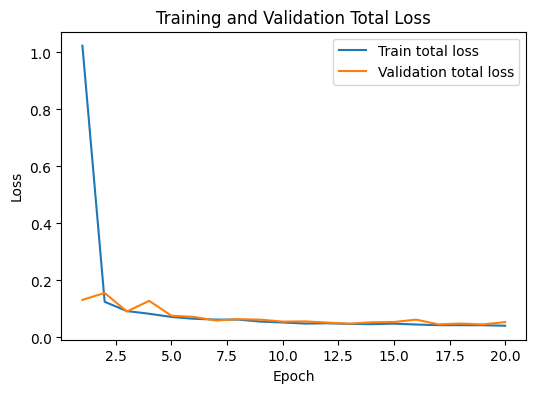

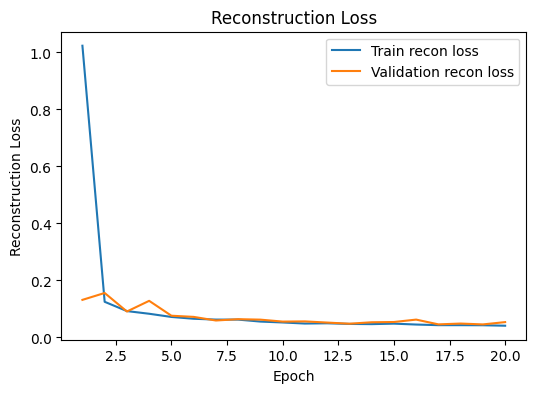

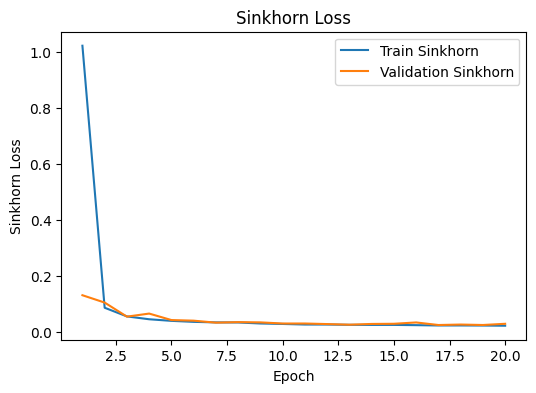

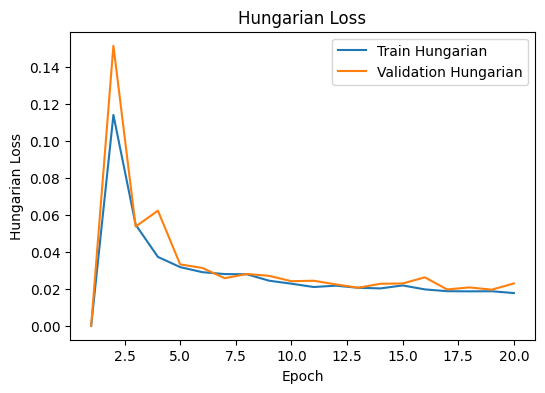

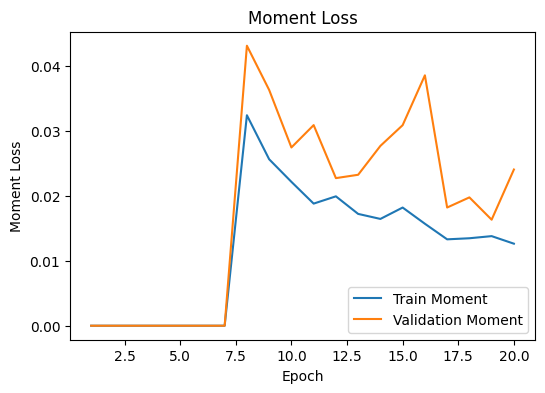

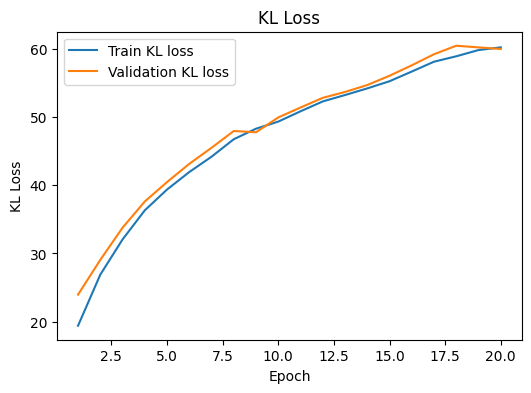

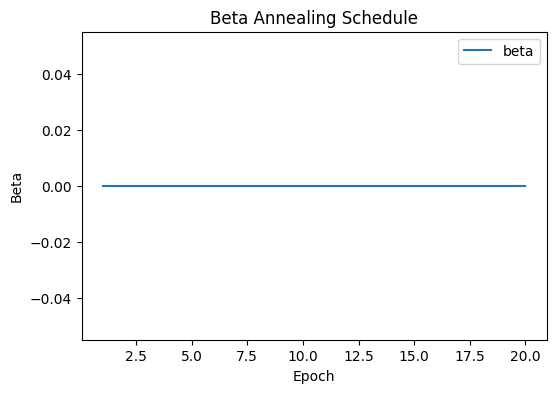

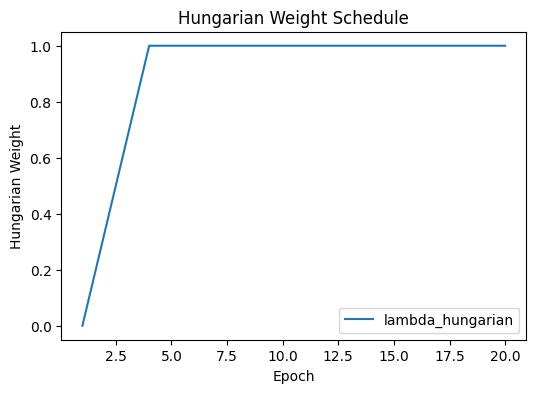

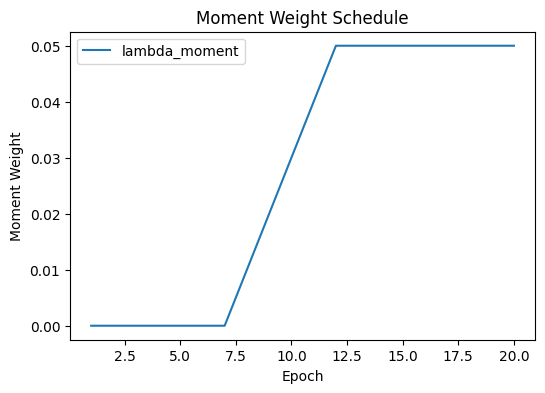

In [23]:
plot_training_history(history)

## Load the best saved model and use it for test performance

In [24]:
model_test = DeepSet_Auto_encoder_v3_SetTransformer(in_features=in_features_,
                                     feats_encoder=feats_encoder_, 
                                     feats_latent=feats_latent_, 
                                     feats_decoder=feats_decoder_,
                                     N_elements_in_set=N_elements_in_set)

model_test.load_state_dict(torch.load('model.pt'))
model_test.to(device)



DeepSet_Auto_encoder_v3_SetTransformer(
  (encoder): SetTransformerEncoder(
    (input_proj): Linear(in_features=3, out_features=64, bias=True)
    (sab_layers): ModuleList(
      (0-1): 2 x SAB(
        (mab): MAB(
          (fc_q): Linear(in_features=64, out_features=64, bias=True)
          (fc_k): Linear(in_features=64, out_features=64, bias=True)
          (fc_v): Linear(in_features=64, out_features=64, bias=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
          )
          (fc_o): Sequential(
            (0): Linear(in_features=64, out_features=64, bias=True)
            (1): ReLU()
            (2): Linear(in_features=64, out_features=64, bias=True)
          )
          (ln0): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          (ln1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (pma): PMA(
      (mab): MAB(
        (fc_q): Linear(in_f

In [25]:
beta = history["betas"][-1] if "history" in globals() else 1e-3

loss, recon, kl, sink, hung, mom = test(model_test, device, valid_loader, beta=beta)
print(f"valid Recon: {recon:.6f}")
print(f"valid loss: {loss:.6f}")
print(f"valid Moment: {mom:.6f}")

loss, recon, kl, sink, hung, mom = test(model_test, device, test_loader, beta=beta)
print(f"test Recon: {recon:.6f}")
print(f"test Moment: {mom:.6f}")

loss, recon, kl, sink, hung, mom = test(model_test, device, ood_loader, beta=beta)
print(f"ood Recon: {recon:.6f}")
print(f"ood Moment: {mom:.6f}")

valid Recon: 0.011694
valid loss: 0.011694
valid Moment: 60.204691
test Recon: 0.008989
test Moment: 60.227372
ood Recon: 0.010500
ood Moment: 59.815295


## lookinf at recostructions of Autoencoder

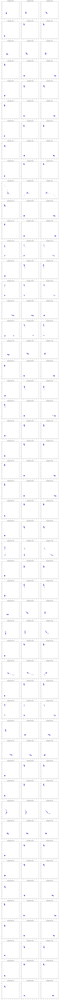

In [26]:
import importlib

# Safe reload without rebinding your NN variable named `model`
viz_mod = importlib.import_module("model.visualizations")
importlib.reload(viz_mod)

from model.visualizations import (
    collect_all_sets_z,
    pca_and_highlight_classes,
    show_reconstruction_examples,
    umap_and_highlight_classes,
    visualize_samples,
    visualize_samples_3d,
)

# If `model` was overwritten elsewhere, recover from `model_test`
if ("model" not in globals()) or (not hasattr(model, "eval")):
    if "model_test" in globals() and hasattr(model_test, "eval"):
        model = model_test

show_reconstruction_examples(model_test, test_loader, device, n_show_examples=50)

## 7 Analyze the latent structure

## 7.1 visualize latent

### Trajectories:

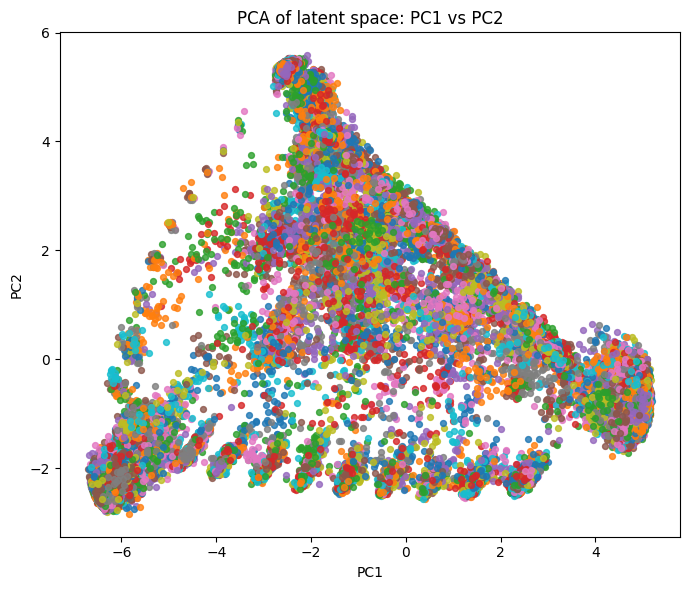

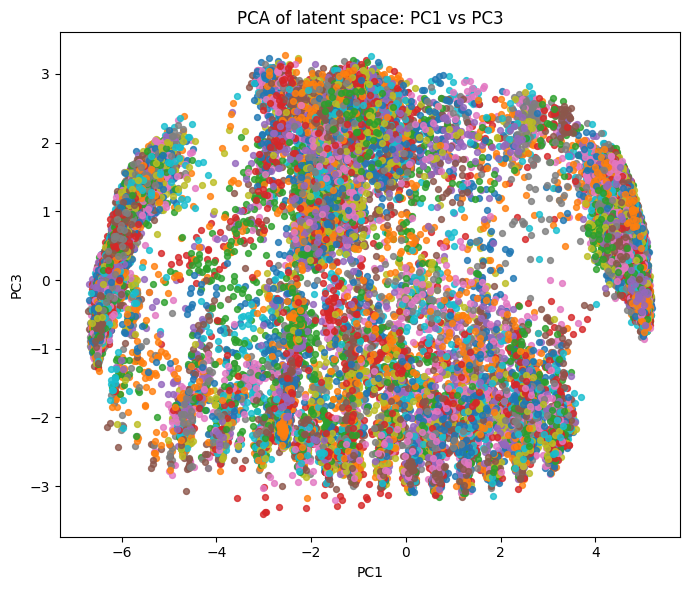

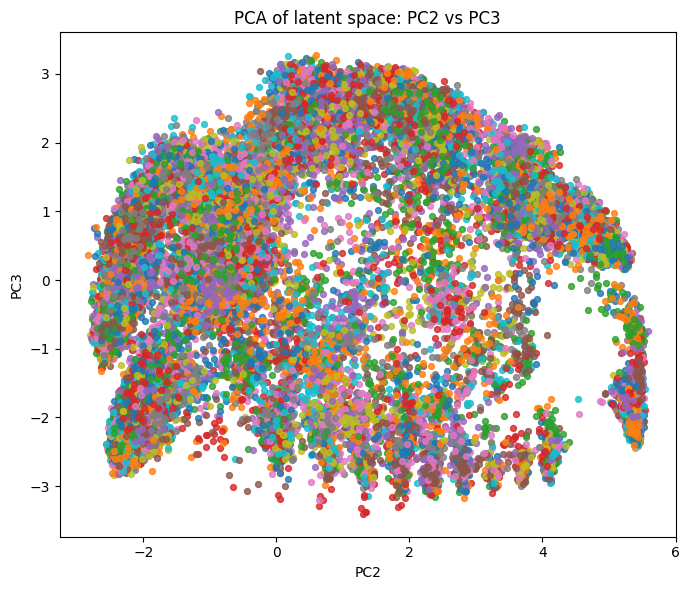

In [27]:
# -----------------------------
# Example usage
# -----------------------------
model_for_latent = model if ("model" in globals() and hasattr(model, "eval")) else model_test

Z_train, y_train = collect_all_sets_z(model_for_latent, train_loader, device)
Z_val,   y_val   = collect_all_sets_z(model_for_latent, valid_loader, device)
Z_test,  y_test  = collect_all_sets_z(model_for_latent, test_loader, device)
Z_ood,   y_ood   = collect_all_sets_z(model_for_latent, ood_loader, device)

pca_and_highlight_classes(Z_train, y_train, pcx=1, pcy=2)
pca_and_highlight_classes(Z_train, y_train, pcx=1, pcy=3)
pca_and_highlight_classes(Z_train, y_train, pcx=2, pcy=3)

# umap_and_highlight_classes(Z, y)

In [28]:


import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# -----------------------------
# Latent collection
# -----------------------------
model_for_latent = model if ("model" in globals() and hasattr(model, "eval")) else model_test

Z_train, y_train = collect_all_sets_z(model_for_latent, train_loader, device)
Z_val,   y_val   = collect_all_sets_z(model_for_latent, valid_loader, device)
Z_test,  y_test  = collect_all_sets_z(model_for_latent, test_loader, device)
Z_ood,   y_ood   = collect_all_sets_z(model_for_latent, ood_loader, device)

# -----------------------------
# PCA helpers
# -----------------------------
def fit_pca_on_reference(Z_ref, n_components=None):
    """
    Fit PCA on a reference set (usually train) and return:
      - fitted PCA object
      - transformed reference coordinates
    """
    pca = PCA(n_components=n_components)
    Z_ref_pca = pca.fit_transform(Z_ref)
    return pca, Z_ref_pca

def transform_with_pca(pca, Z):
    """
    Transform new data using an already-fitted PCA.
    """
    return pca.transform(Z)

# -----------------------------
# 2D PCA plot
# -----------------------------
def pca_plot_2d(
    Z_pca,
    y,
    pcx=1,
    pcy=2,
    title=None,
    figsize=(7, 6),
    s=22,
    alpha=0.8
):
    ix = pcx - 1
    iy = pcy - 1

    plt.figure(figsize=figsize)

    classes = np.unique(y)
    for cls in classes:
        mask = y == cls
        plt.scatter(
            Z_pca[mask, ix],
            Z_pca[mask, iy],
            s=s,
            alpha=alpha,
            label=str(cls)
        )

    plt.xlabel(f"PC{pcx}")
    plt.ylabel(f"PC{pcy}")
    plt.title(title if title is not None else f"PCA latent space: PC{pcx} vs PC{pcy}")
    plt.legend(title="Class", frameon=False)
    plt.tight_layout()
    plt.show()

# -----------------------------
# 3D PCA plot
# -----------------------------
def pca_plot_3d(
    Z_pca,
    y,
    pcx=1,
    pcy=2,
    pcz=3,
    title=None,
    interactive=True,
    s=4
):
    ix = pcx - 1
    iy = pcy - 1
    iz = pcz - 1

    title = title if title is not None else f"PCA latent space: PC{pcx} vs PC{pcy} vs PC{pcz}"

    if interactive:
        try:
            import plotly.express as px

            # build a small dataframe-like dict
            data = {
                f"PC{pcx}": Z_pca[:, ix],
                f"PC{pcy}": Z_pca[:, iy],
                f"PC{pcz}": Z_pca[:, iz],
                "class": y.astype(str)
            }

            fig = px.scatter_3d(
                data,
                x=f"PC{pcx}",
                y=f"PC{pcy}",
                z=f"PC{pcz}",
                color="class",
                opacity=0.8,
                title=title
            )

            fig.update_traces(marker=dict(size=s))
            fig.update_layout(
                margin=dict(l=0, r=0, b=0, t=40),
                legend_title_text="Class"
            )
            fig.show()
            return

        except ImportError:
            print("plotly not found, falling back to matplotlib 3D.")

    # matplotlib fallback
    from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection="3d")

    classes = np.unique(y)
    for cls in classes:
        mask = y == cls
        ax.scatter(
            Z_pca[mask, ix],
            Z_pca[mask, iy],
            Z_pca[mask, iz],
            s=18,
            alpha=0.8,
            label=str(cls)
        )

    ax.set_xlabel(f"PC{pcx}")
    ax.set_ylabel(f"PC{pcy}")
    ax.set_zlabel(f"PC{pcz}")
    ax.set_title(title)
    ax.legend(title="Class")
    plt.tight_layout()
    plt.show()


In [29]:
# -----------------------------
pca, Z_train_pca = fit_pca_on_reference(Z_train)

# Transform other splits using same PCA
Z_val_pca  = transform_with_pca(pca, Z_val)
Z_test_pca = transform_with_pca(pca, Z_test)
Z_ood_pca  = transform_with_pca(pca, Z_ood)

# -----------------------------
# Example plots
# -----------------------------
# Train
pca_plot_3d(Z_train_pca, y_train, pcx=1, pcy=2, pcz=3, title="Train: PC1-PC2-PC3", interactive=True)


/home/tiamheydari/anaconda3/envs/nn/lib/python3.11/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




## 7.2 cluster latent

### 7.2.1: Define and refine individual cell states

In [ ]:
# =========================================================
# PRE-STEP — collect colony-level objects needed later
# defines:
#   points_list
#   xhat_list
#   y
#   meta_list
#   seq_length_all
#   Z
# =========================================================

import numpy as np
import torch
from torch.utils.data import RandomSampler

# choose loader and whether to use mu or sampled z
loader = train_loader      # should be shuffle=False for analysis
use_mu = True

if isinstance(loader.sampler, RandomSampler):
    print("WARNING: loader uses random sampling / shuffle=True. For analysis, use shuffle=False.")

model.eval()

Z_chunks = []
y_chunks = []
seq_chunks = []

points_list = []
xhat_list = []
meta_list = []

with torch.no_grad():
    for batch in loader:
        x = batch["point"].to(device)
        y_batch = batch["label"].cpu()
        seq_length = batch["seq_length"].cpu().numpy()
        meta = batch["meta"]

        x_hat, z, mu, logvar = model(x)
        latent = mu if use_mu else z

        Z_chunks.append(latent.cpu())
        y_chunks.append(y_batch)
        seq_chunks.append(torch.tensor(seq_length))

        x_cpu = batch["point"].cpu().numpy()
        xhat_cpu = x_hat.cpu().numpy()

        for i in range(x_cpu.shape[0]):
            n_i = int(seq_length[i])

            # original colony, padding removed
            x_i = x_cpu[i, :n_i, :].copy()

            # reconstructed colony, padding removed
            xhat_i = xhat_cpu[i, :n_i, :].copy()

            points_list.append(x_i)
            xhat_list.append(xhat_i)
            meta_list.append(meta[i])

Z = torch.cat(Z_chunks, dim=0).numpy()
y = torch.cat(y_chunks, dim=0).numpy()
seq_length_all = torch.cat(seq_chunks, dim=0).numpy()

# print("Z shape:", Z.shape)
# print("len(points_list):", len(points_list))
# print("len(xhat_list):", len(xhat_list))
# print("len(y):", len(y))
# print("len(meta_list):", len(meta_list))
# print("len(seq_length_all):", len(seq_length_all))
# print("all aligned:", len(points_list) == len(xhat_list) == len(y) == len(meta_list) == len(seq_length_all) == len(Z))



# 7.2.1 — Define and refine individual cell states
# =========================================================

import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
# ---------------------------------------------------------
# ASSUMPTIONS
# You already have:
#   points_list   : list of arrays, each [n_i, 3]   original cells
#   xhat_list     : list of arrays, each [n_i, 3]   reconstructed set elements
#   y             : array of topology_id per colony
#   meta_list     : list of dicts, one per colony
#   seq_length_all: array of colony sizes
#   Z             : latent matrix, one latent vector per colony   (optional)
# ---------------------------------------------------------

print("n colonies:", len(points_list))
print("n reconstructions:", len(xhat_list))
print("len(y):", len(y))
print("len(meta_list):", len(meta_list))

# STEP 1 — flatten ORIGINAL colonies into one cell-level table
# =========================================================
orig_X_rows = []
orig_obs_rows = []

for sample_id, points in enumerate(points_list):
    n_i = points.shape[0]
    meta_i = meta_list[sample_id]
    topology_id = int(y[sample_id])

    for cell_local_id in range(n_i):
        g = points[cell_local_id]

        row = {
            "sample_id": sample_id,                 # colony / set index
            "cell_local_id": cell_local_id,         # position inside that colony array
            "topology_id": topology_id,
            "colony_size": n_i,
            "source": "original",
        }

        # add colony metadata to every cell row
        for k, v in meta_i.items():
            row[k] = v

        # optional: attach colony latent coords to each cell
        if "Z" in globals():
            for j in range(Z.shape[1]):
                row[f"latent_{j}"] = float(Z[sample_id, j])

        orig_X_rows.append(g)
        orig_obs_rows.append(row)

orig_X = np.vstack(orig_X_rows).astype(np.float32)
orig_obs = pd.DataFrame(orig_obs_rows)

adata_cells_orig = ad.AnnData(
    X=orig_X,
    obs=orig_obs,
    var=pd.DataFrame(index=["g1", "g2", "g3"])
)

# print(adata_cells_orig)
# print(adata_cells_orig.obs.head())

n colonies: 39827
n reconstructions: 39827
len(y): 39827
len(meta_list): 39827


/home/tiamheydari/anaconda3/envs/nn/lib/python3.11/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.



In [ ]:
# STEP 3 — run PCA + neighbors + Leiden on ORIGINAL cells
# This gives provisional cell-state categories
# =========================================================
adata_cells = adata_cells_orig.copy()

# keep raw counts/values
adata_cells.layers["raw_expr"] = adata_cells.X.copy()

# with only 3 genes, PCA is not very meaningful beyond 2-3 dims,
# but we keep the standard pipeline for consistency
sc.pp.scale(adata_cells, zero_center=True, max_value=10)

# with 3 genes, n_comps cannot exceed 3
sc.tl.pca(adata_cells, n_comps=2, svd_solver="arpack")

# choose neighbors on PCA space
cell_n_neighbors = 100
cell_leiden_resolution = 0.02

sc.pp.neighbors(
    adata_cells,
    n_neighbors=cell_n_neighbors,
    use_rep="X_pca"
)

# sc.tl.umap(adata_cells)
# print("\nCell-level clustering done.")
# print("n cell clusters:", adata_cells.obs["cell_leiden"].nunique())
# print(adata_cells.obs["cell_leiden"].value_counts().sort_index())

/tmp/ipykernel_3522506/345366116.py:3: FutureWarning:

In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.



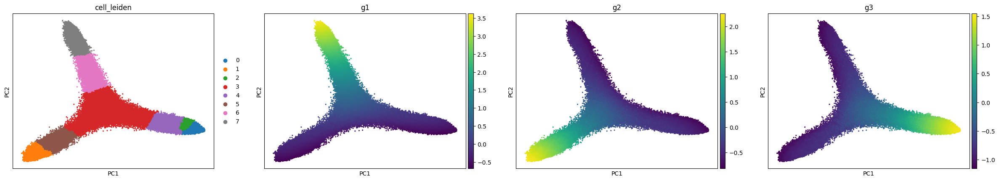

In [ ]:
# STEP 4 — visualize cell-level structure
# =========================================================
sc.tl.leiden(adata_cells,resolution=0.02,key_added="cell_leiden", random_state=0)
sc.pl.pca(adata_cells,color=["cell_leiden",'g1','g2','g3'],size=20)

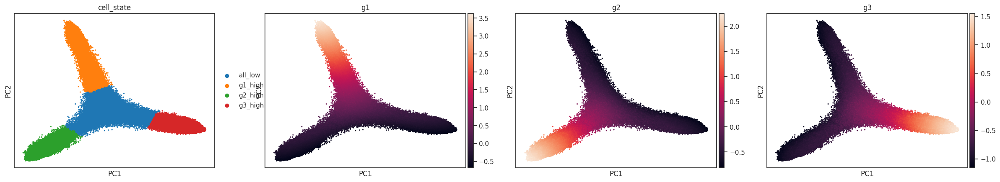

In [ ]:
# rename clusters based on observations:
# rename clusters
rename_map = {
    "3": "all_low",

    "7": "g1_high",
    "6": "g1_high",

    "1": "g2_high",
    "5": "g2_high",

    "0": "g3_high",
    "2": "g3_high",
    "4": "g3_high",
}
adata_cells.obs["cell_state"] = (adata_cells.obs["cell_leiden"].astype(str).map(rename_map).fillna(adata_cells.obs["cell_leiden"].astype(str)))
# make it categorical
adata_cells.obs["cell_state"] = pd.Categorical(adata_cells.obs["cell_state"])

sc.pl.pca(adata_cells, color=["cell_state", "g1", "g2", "g3"],size=20)

cell_state will store the final clustering of individual cell states

### 7.2.2: use latent space of the model Z to find clustering on the latent space

In [ ]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from torch.utils.data import RandomSampler

In [ ]:
# ---------------------------------------------------------
# ASSUMPTION:
# You already have from the previous collection step:
#   Z              : (n_colonies, latent_dim)
#   y              : topology_id per colony
#   seq_length_all : colony size
#   meta_list      : metadata per colony
#   points_list    : original colonies (list of [n_i, 3])
#   xhat_list      : reconstructed colonies (list of [n_i, 3])
#
# IMPORTANT:
# Prefer mu, not sampled z, for clustering.
# So Z here should ideally already be based on mu.
# ---------------------------------------------------------

print("Z shape:", Z.shape)
print("number of colonies:", len(Z))
print("len(y):", len(y))
print("len(meta_list):", len(meta_list))
print("len(points_list):", len(points_list))
print("len(xhat_list):", len(xhat_list))



Z shape: (39827, 8)
number of colonies: 39827
len(y): 39827
len(meta_list): 39827
len(points_list): 39827
len(xhat_list): 39827


In [ ]:
# STEP 1 — make one colony-level metadata table
# one row = one set / one colony / one latent point
# =========================================================
obs_rows = []

for sample_id in range(len(Z)):
    row = {
        "sample_id": sample_id,
        "topology_id": int(y[sample_id]),
        "colony_size": int(seq_length_all[sample_id]),
    }

    meta_i = meta_list[sample_id]
    for k, v in meta_i.items():
        row[k] = v

    obs_rows.append(row)

latent_obs = pd.DataFrame(obs_rows)

print(latent_obs.head())


   sample_id  topology_id  colony_size  colony_id  param_set_id cell_id  k1  \
0          0         2059           10         39             0    None   6   
1          1           64           10         27             0    None   6   
2          2         3268           10         12             0    None   6   
3          3         2031           10         15             0    None   6   
4          4           62           10         47             0    None   6   

    k2  signal_s1  signal_s2  signal_s3  
0  1.0       0.18       0.16       0.85  
1  1.0       0.63       0.46       0.60  
2  1.0       0.36       0.80       0.22  
3  1.0       0.14       0.16       0.85  
4  1.0       0.30       0.18       0.82  


In [ ]:
# STEP 2 — create colony-level AnnData from latent vectors
# =========================================================
latent_var_names = [f"z{i}" for i in range(Z.shape[1])]

adata_latent = ad.AnnData(
    X=Z.astype(np.float32),
    obs=latent_obs.copy(),
    var=pd.DataFrame(index=latent_var_names)
)
print(adata_latent)

# STEP 3 — store original colonies
# do NOT put them in layers:
# they are variable-length sets, not aligned matrices
# =========================================================
adata_latent.uns["points_list"] = points_list
print("Stored variable-length original/reconstructed sets in adata_latent.uns")

# STEP 4 — scale latent space
# =========================================================
#adata_latent.layers["Z_raw"] = adata_latent.X.copy()
#adata_latent.X = StandardScaler().fit_transform(adata_latent.X).astype(np.float32)

# STEP 5 — optional PCA on latent space
# if latent dim is already small, this is mostly for plotting
# =========================================================
latent_dim = adata_latent.X.shape[1]

if latent_dim >= 2:
    n_pcs = min(latent_dim - 1, 10) if latent_dim > 2 else 2
    if n_pcs >= 2:
        sc.tl.pca(adata_latent, n_comps=n_pcs, svd_solver="arpack")
        use_rep_for_neighbors = "X_pca"
    else:
        use_rep_for_neighbors = "X"
else:
    use_rep_for_neighbors = "X"

print("use_rep_for_neighbors:", use_rep_for_neighbors)

AnnData object with n_obs × n_vars = 39827 × 8
    obs: 'sample_id', 'topology_id', 'colony_size', 'colony_id', 'param_set_id', 'cell_id', 'k1', 'k2', 'signal_s1', 'signal_s2', 'signal_s3'
Stored variable-length original/reconstructed sets in adata_latent.uns
use_rep_for_neighbors: X_pca


/home/tiamheydari/anaconda3/envs/nn/lib/python3.11/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.



In [ ]:
# # adata_latent.obs.drop(columns=['cell_id'], inplace=True)

# for key, obj in adata_latent.uns.items():
    
#     # Case 1: DataFrame
#     if isinstance(obj, pd.DataFrame):
#         obj.columns = obj.columns.astype(str)
#         obj.index = obj.index.astype(str)
#         adata_latent.uns[key] = obj

#     # Case 2: Series
#     elif isinstance(obj, pd.Series):
#         obj.index = obj.index.astype(str)
#         adata_latent.uns[key] = obj

#     # Case 3: dict (nested issue)
#     elif isinstance(obj, dict):
#         adata_latent.uns[key] = {str(k): v for k, v in obj.items()}
        
# adata_latent.write("DeepSets_adata/k2_1/adata_latent.h5ad")

In [ ]:
# # adata_cells.obs.drop(columns=['cell_id'], inplace=True)

# for key, obj in adata_cells.uns.items():
    
#     # Case 1: DataFrame
#     if isinstance(obj, pd.DataFrame):
#         obj.columns = obj.columns.astype(str)
#         obj.index = obj.index.astype(str)
#         adata_cells.uns[key] = obj

#     # Case 2: Series
#     elif isinstance(obj, pd.Series):
#         obj.index = obj.index.astype(str)
#         adata_cells.uns[key] = obj

#     # Case 3: dict (nested issue)
#     elif isinstance(obj, dict):
#         adata_cells.uns[key] = {str(k): v for k, v in obj.items()}
        
# adata_cells.write("DeepSets_adata/k2_1/adata_cells.h5ad")

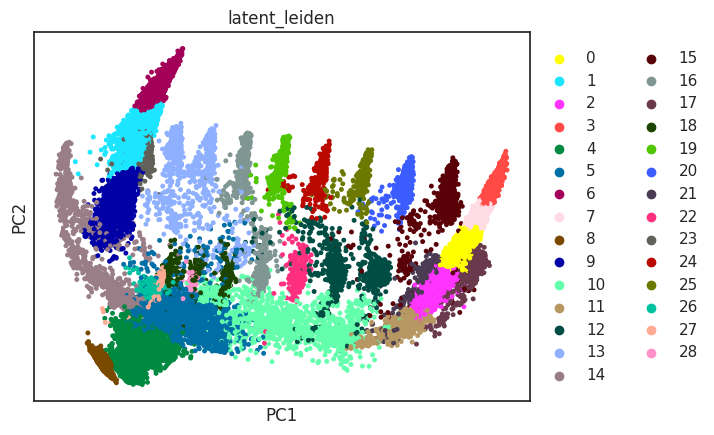

In [ ]:
# STEP 6 — Leiden clustering on colony latent space
# =========================================================
latent_n_neighbors = 20
latent_leiden_resolution = 0.2

sc.pp.neighbors(adata_latent,n_neighbors=latent_n_neighbors,use_rep=use_rep_for_neighbors)

sc.tl.leiden(adata_latent,resolution=latent_leiden_resolution,key_added="latent_leiden", random_state=0)

# STEP 7 — visualize colony-level latent structure
# =========================================================
sc.pl.pca(adata_latent,color=["latent_leiden"],size=50,legend_loc="right margin")


In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px
import scanpy as sc

# make sure PCA exists
if "X_pca" not in adata_latent.obsm:
    sc.tl.pca(adata_latent)

# choose which obs column to color by
color_key = "latent_leiden"

# build dataframe from first 3 PCs
X_pca = adata_latent.obsm["X_pca"]
df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "PC3": X_pca[:, 2],
    color_key: adata_latent.obs[color_key].astype(str).values,
})

# interactive 3D plot
fig = px.scatter_3d(
    df,
    x="PC1",
    y="PC2",
    z="PC3",
    color=color_key,
    opacity=0.8,
)

fig.update_traces(marker=dict(size=4))
fig.update_layout(
    width=800,
    height=700,
    margin=dict(l=0, r=0, b=0, t=30),
    legend_title=color_key,
)

fig.show()

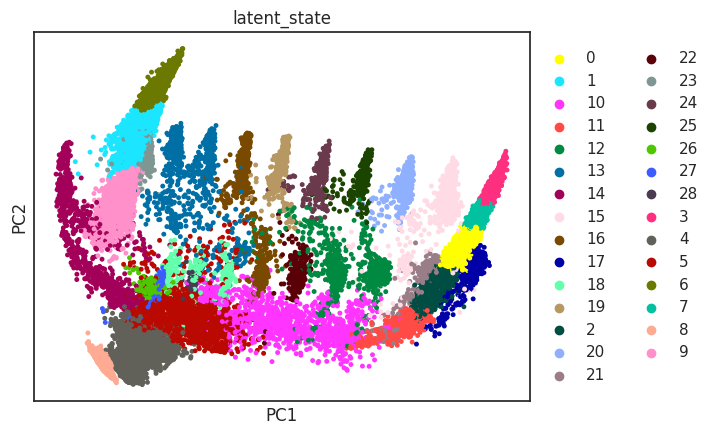

In [ ]:
# STEP 6.5 — rename / merge clusters
# =========================================================
# Example:
# clusters "0" and "3" become one merged group called "state_A"
# cluster "1" becomes "state_B"
# clusters "2" and "4" become "state_C"
rename_map = {
     # "1": "0",
     # "10": "0",

     # "3": "2",
     
}

# keep original leiden labels, create a new merged column
adata_latent.obs["latent_state"] = (adata_latent.obs["latent_leiden"].astype(str).map(rename_map).fillna(adata_latent.obs["latent_leiden"].astype(str)))
adata_latent.obs["latent_state"] = pd.Categorical(adata_latent.obs["latent_state"])


# STEP 7 — visualize colony-level latent structure
# =========================================================
sc.pl.pca( adata_latent,color=["latent_state"],size=50,legend_loc="right margin")


## ____

In [ ]:
loader_0 = data.DataLoader(
    pc_dataset_0,
    batch_size=64,
    shuffle=False,
    collate_fn=lambda b: create_batch(b, K=None)
)

Z0, _ = collect_all_sets_z(model, loader_0, device, use_mu=True)



AttributeError: 'Tensor' object has no attribute 'DataLoader'

In [ ]:
Z250 = adata_latent.X   # (3411, latent_dim)

Z0, _ = collect_all_sets_z(model, loader_0, device)

NameError: name 'loader_0' is not defined

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
Z250_pca = pca.fit_transform(Z250)
Z0_pca   = pca.transform(Z0)

NameError: name 'Z0' is not defined

In [ ]:
latent_states = adata_latent.obs["latent_state"].astype("category")
colors = latent_states.cat.codes

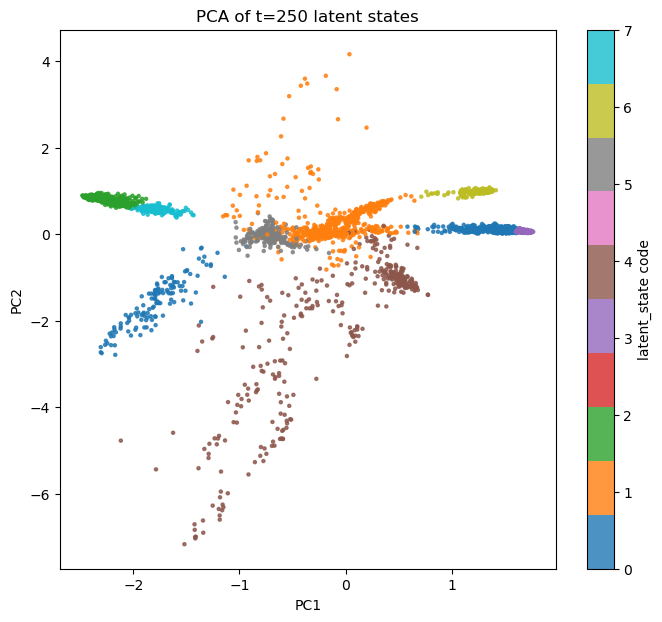

In [ ]:
import matplotlib.pyplot as plt

# Get the latent_state as numeric codes for coloring
latent_states = adata_latent.obs["latent_state"].astype("category")
colors = latent_states.cat.codes

plt.figure(figsize=(8, 7))
plt.scatter(
    Z250_pca[:, 0],        # PC1
    Z250_pca[:, 1],        # PC2
    c=colors,              # color by latent_state
    cmap="tab10",
    s=5,
    alpha=0.8
)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of t=250 latent states")
plt.colorbar(label="latent_state code")
plt.show()

In [ ]:
# Ensure both topology_id and colony_id are Python ints
keys_250 = [
    (int(topo), int(col))
    for topo, col in zip(adata_latent.obs["topology_id"], adata_latent.obs["colony_id"])
]
map_250 = {k: i for i, k in enumerate(keys_250)}

keys_0 = [
    (int(m["topology_id"]), int(m["colony_id"]))
    for m in pc_dataset_0.meta_list
]

In [ ]:
# Example: overlay only topology_id = 3
target_topology = 49
selected_pairs = [k for k in keys_0 if k[0] == target_topology]

selected_pairs_existing = [k for k in selected_pairs if k in map_250]

# t=0 indices
indices_0 = [i for i, k in enumerate(keys_0) if k in selected_pairs_existing]
Z0_selected = Z0_pca[indices_0]

# t=250 indices
indices_250 = [map_250[k] for k in selected_pairs_existing]
Z250_selected = Z250_pca[indices_250]

print("Pairs to plot:", selected_pairs_existing)

Pairs to plot: [(49, 0)]


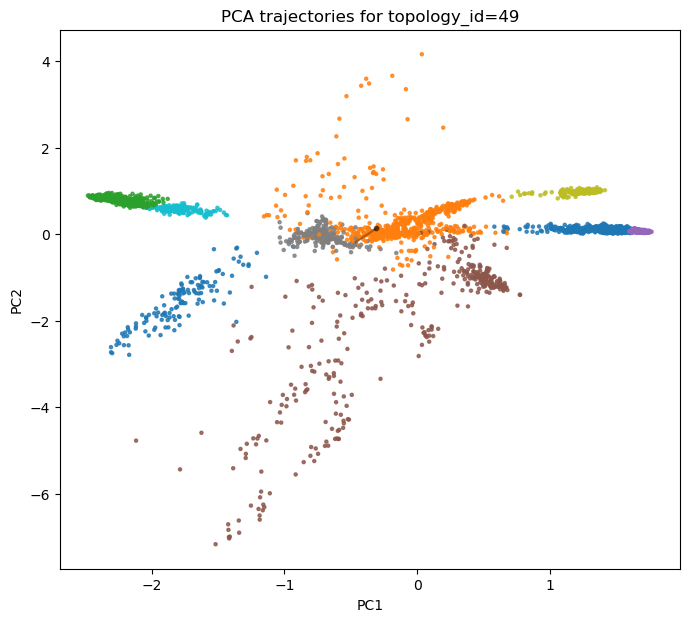

In [ ]:
selected_pairs = [(49, 0)]
# Collect Z0 latent vectors for the selected colonies
indices_0 = [i for i, k in enumerate(keys_0) if k in selected_pairs]
Z0_selected = Z0_pca[indices_0]

# Collect corresponding t=250 coordinates
indices_250 = [map_250[k] for k in selected_pairs]
Z250_selected = Z250_pca[indices_250]
import matplotlib.pyplot as plt

plt.figure(figsize=(8,7))

# Base scatter of all t=250 points
latent_states = adata_latent.obs["latent_state"].astype("category")
colors = latent_states.cat.codes
plt.scatter(Z250_pca[:,0], Z250_pca[:,1], c=colors, cmap="tab10", s=5, alpha=0.8)

# Overlay t=0 → t=250 trajectories
for i in range(len(Z0_selected)):
    plt.plot(
        [Z0_selected[i,0], Z250_selected[i,0]],
        [Z0_selected[i,1], Z250_selected[i,1]],
        color="black",
        alpha=0.3
    )

# Optionally mark t=0 points
plt.scatter(Z0_selected[:,0], Z0_selected[:,1], color="black", s=10, alpha=0.5, label="t=0")

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"PCA trajectories for topology_id={target_topology}")
plt.show()

## ____

Cells with missing latent_state: 0

Latent-state x cell-state fractions:
cell_state     all_low   g1_high   g2_high   g3_high
latent_state                                        
0             0.000000  0.000000  0.000000  1.000000
1             0.000075  0.000000  0.999925  0.000000
10            0.782118  0.083193  0.000000  0.134689
11            0.072848  0.000000  0.000000  0.927152
12            0.133801  0.242333  0.022030  0.601836
13            0.170621  0.025650  0.581130  0.222599
14            0.449013  0.205110  0.345645  0.000232
15            0.042099  0.000247  0.083951  0.873704
16            0.083905  0.234828  0.289182  0.392084
17            0.005017  0.100000  0.000000  0.894983
18            0.127672  0.681298  0.000000  0.191031
19            0.026609  0.000000  0.476609  0.496781
2             0.000820  0.000000  0.000000  0.999180
20            0.005204  0.000000  0.197285  0.797511
21            0.019000  0.196750  0.000000  0.784250
22            0.070390  0.

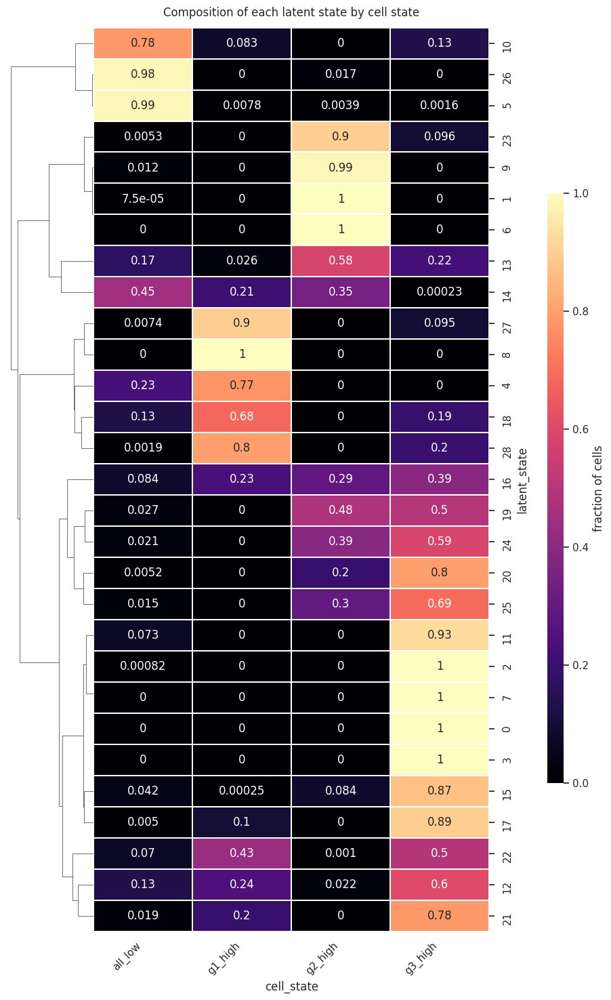

In [ ]:
# =========================================================
# STEP 8 — composition of each latent state
# based on cell-level states
# rows = latent_state
# cols = cell_state
# with seaborn clustermap:
#   - row dendrogram only
#   - no column dendrogram
#   - colorbar moved to the far right
# =========================================================

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_context("talk", font_scale=2)


cell_label_col = "cell_state"   # or "cell_leiden"

# make sure sample_id types match
adata_cells.obs["sample_id"] = adata_cells.obs["sample_id"].astype(int)
adata_latent.obs["sample_id"] = adata_latent.obs["sample_id"].astype(int)

# map each colony/sample_id to its latent state
sample_to_latent = (
    adata_latent.obs[["sample_id", "latent_state"]]
    .drop_duplicates(subset=["sample_id"])
    .set_index("sample_id")["latent_state"]
)

# assign each cell the latent state of its colony
adata_cells.obs["latent_state"] = adata_cells.obs["sample_id"].map(sample_to_latent)

print("Cells with missing latent_state:", adata_cells.obs["latent_state"].isna().sum())

# rows = latent_state, cols = cell_state
latent_cellstate_counts = pd.crosstab(
    adata_cells.obs["latent_state"],
    adata_cells.obs[cell_label_col]
)

latent_cellstate_frac = latent_cellstate_counts.div(
    latent_cellstate_counts.sum(axis=1),
    axis=0
).fillna(0.0)

print("\nLatent-state x cell-state fractions:")
print(latent_cellstate_frac)

# summary table
latent_state_summary_rows = []

for latent_state in latent_cellstate_counts.index:
    row_counts = latent_cellstate_counts.loc[latent_state]
    row_frac = latent_cellstate_frac.loc[latent_state]

    n_cells = int(row_counts.sum())
    dominant_cell_state = str(row_frac.idxmax())
    dominant_fraction = float(row_frac.max())
    n_cell_states_present = int((row_counts > 0).sum())

    p = row_frac.values.astype(float)
    p_nonzero = p[p > 0]
    cell_state_entropy = float(-(p_nonzero * np.log2(p_nonzero)).sum()) if len(p_nonzero) > 0 else 0.0

    latent_state_summary_rows.append({
        "latent_state": str(latent_state),
        "n_cells": n_cells,
        "dominant_cell_state": dominant_cell_state,
        "dominant_fraction": dominant_fraction,
        "n_cell_states_present": n_cell_states_present,
        "cell_state_entropy": cell_state_entropy
    })

latent_state_cellstate_summary = pd.DataFrame(latent_state_summary_rows).sort_values(
    ["dominant_fraction", "n_cells"],
    ascending=[False, False]
)

print("\nLatent-state cell-state summary:")
print(latent_state_cellstate_summary)

# ---------------------------------------------------------
# seaborn clustermap
# row clustering only, no column clustering
# ---------------------------------------------------------
sns.set_context("notebook")
sns.set_style("white")

cg = sns.clustermap(
    latent_cellstate_frac,
    row_cluster=True,
    annot=True,
    col_cluster=False,
    cmap="magma",
    vmin=0.0,
    vmax=1.0,
    figsize=(8, max(4, 0.5 * latent_cellstate_frac.shape[0])),
    linewidths=0.2,
    dendrogram_ratio=(0.18, 0.02),     # more room for row dendrogram, almost none for columns
    cbar_pos=(1.02, 0.2, 0.03, 0.6),   # move colorbar further right
    cbar_kws={"label": "fraction of cells"}
)

# labels / formatting
cg.ax_heatmap.set_xlabel(cell_label_col)
cg.ax_heatmap.set_ylabel("latent_state")
cg.ax_heatmap.set_title("Composition of each latent state by cell state", pad=12)

# put row labels on the right side of the heatmap
cg.ax_heatmap.yaxis.tick_right()
cg.ax_heatmap.yaxis.set_label_position("right")
cg.ax_heatmap.tick_params(axis="y", pad=8)

# x tick formatting
plt.setp(cg.ax_heatmap.get_xticklabels(), rotation=45, ha="right")

# hide the unused column dendrogram axis completely
cg.ax_col_dendrogram.set_visible(False)

plt.show()

# ---------------------------------------------------------
# save reordered matrix and linkage
# ---------------------------------------------------------
row_order = cg.dendrogram_row.reordered_ind
latent_cellstate_frac_clustered = latent_cellstate_frac.iloc[row_order, :].copy()

adata_latent.uns["latent_cellstate_counts"] = latent_cellstate_counts
adata_latent.uns["latent_cellstate_frac"] = latent_cellstate_frac

adata_latent.uns["latent_cellstate_frac_clustered"] = latent_cellstate_frac_clustered
adata_latent.uns["latent_state_row_linkage"] = cg.dendrogram_row.linkage
adata_latent.uns["latent_state_cellstate_summary"] = latent_state_cellstate_summary

latent_topology_counts shape: (29, 2388)
latent_topology_frac shape: (29, 2388)


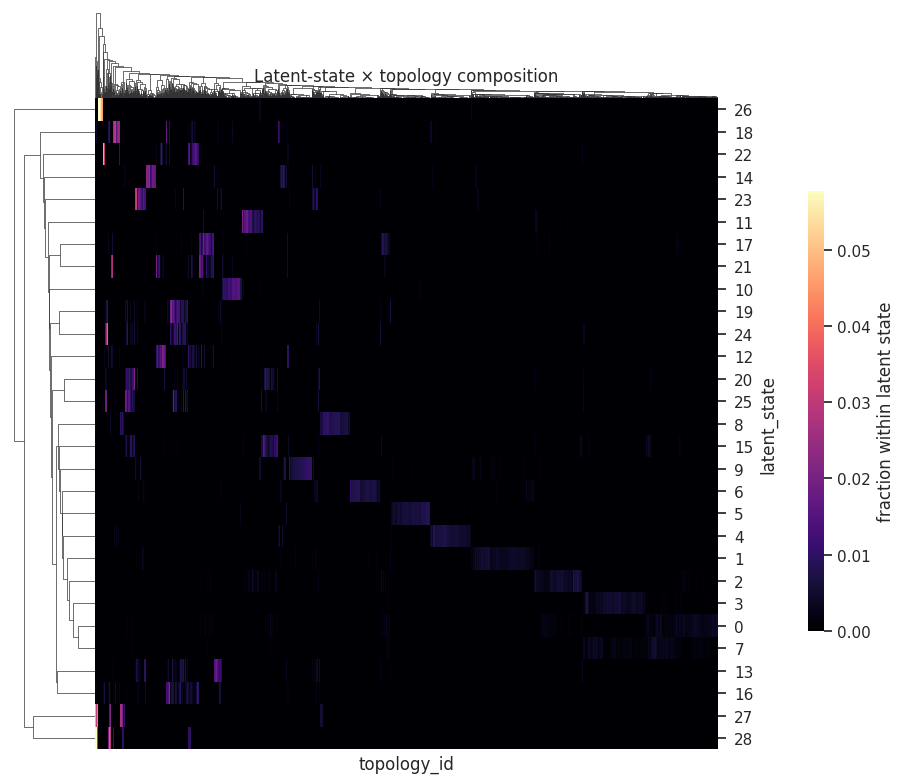


Stored in adata_latent.uns:
['latent_topology_counts', 'latent_topology_frac', 'latent_topology_frac_clustered', 'latent_topology_row_linkage', 'latent_topology_col_linkage']


In [ ]:
# =========================================================
# STEP 9 — full latent_state x topology heatmap
# rows = latent_state
# cols = topology_id
# cluster BOTH rows and columns to reveal block structure
# =========================================================

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

latent_label_col = "latent_state"      # or "latent_leiden"
topology_label_col = "topology_id"

# ---------------------------------------------------------
# 1) build full matrix
# ---------------------------------------------------------
latent_topology_counts = pd.crosstab(
    adata_latent.obs[latent_label_col],
    adata_latent.obs[topology_label_col]
)

# row-normalized:
# each row sums to 1
# interpretation: composition of each latent state by topology
latent_topology_frac = latent_topology_counts.div(
    latent_topology_counts.sum(axis=1),
    axis=0
).fillna(0.0)

print("latent_topology_counts shape:", latent_topology_counts.shape)
print("latent_topology_frac shape:", latent_topology_frac.shape)

# keep the full dataframe
latent_topology_df = latent_topology_frac.copy()

# ---------------------------------------------------------
# 2) clustered full heatmap
# IMPORTANT:
# with ~2000 columns, topology labels should be hidden
# ---------------------------------------------------------
sns.set_context("notebook")
sns.set_style("white")

cg = sns.clustermap(
    latent_topology_df,
    row_cluster=True,
    col_cluster=True,
    method="average",
    metric="euclidean",
    cmap="magma",
    vmin=0.0,
    vmax=latent_topology_df.values.max()/1.5,
    figsize=(8, 8),
    xticklabels=False,                  # too many topologies to show
    yticklabels=True,
    dendrogram_ratio=(0.12, 0.12),
    cbar_pos=(1.02, 0.2, 0.02, 0.55),
    cbar_kws={"label": "fraction within latent state"}
)

cg.ax_heatmap.set_xlabel("topology_id")
cg.ax_heatmap.set_ylabel("latent_state")
cg.ax_heatmap.set_title("Latent-state × topology composition", pad=12)

# put row labels on the right so they don't collide with the row dendrogram
cg.ax_heatmap.yaxis.tick_right()
cg.ax_heatmap.yaxis.set_label_position("right")
cg.ax_heatmap.tick_params(axis="y", pad=6)

plt.show()

# ---------------------------------------------------------
# 3) save reordered matrix + linkage
# ---------------------------------------------------------
row_order = cg.dendrogram_row.reordered_ind
col_order = cg.dendrogram_col.reordered_ind

latent_topology_frac_clustered = latent_topology_df.iloc[row_order, col_order].copy()

adata_latent.uns["latent_topology_counts"] = latent_topology_counts
adata_latent.uns["latent_topology_frac"] = latent_topology_frac
adata_latent.uns["latent_topology_frac_clustered"] = latent_topology_frac_clustered
adata_latent.uns["latent_topology_row_linkage"] = cg.dendrogram_row.linkage
adata_latent.uns["latent_topology_col_linkage"] = cg.dendrogram_col.linkage

print("\nStored in adata_latent.uns:")
print([
    "latent_topology_counts",
    "latent_topology_frac",
    "latent_topology_frac_clustered",
    "latent_topology_row_linkage",
    "latent_topology_col_linkage"
])

(29, 2388)
Column sums (should be ~1):
topology_id
0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
dtype: float64


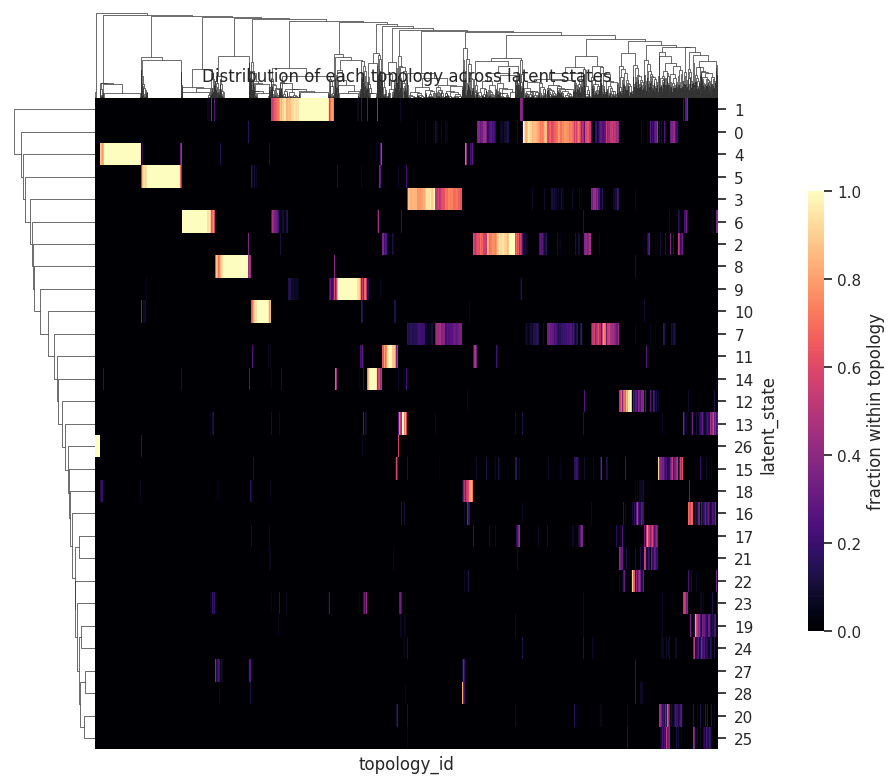

In [ ]:
# =========================================================
# COLUMN-NORMALIZED version
# each column sums to 1
# interpretation:
#   for each topology, how it is distributed across latent states
# =========================================================

# starting from the same raw count matrix:
# latent_topology_counts = pd.crosstab(
#     adata_latent.obs[latent_label_col],
#     adata_latent.obs[topology_label_col]
# )

latent_topology_colnorm = latent_topology_counts.div(
    latent_topology_counts.sum(axis=0),
    axis=1
).fillna(0.0)

print(latent_topology_colnorm.shape)
print("Column sums (should be ~1):")
print(latent_topology_colnorm.sum(axis=0).head())

sns.set_context("notebook")
sns.set_style("white")

cg = sns.clustermap(
    latent_topology_colnorm,
    row_cluster=True,
    col_cluster=True,
    method="average",
    metric="euclidean",
    cmap="magma",
    vmin=0.0,
    vmax=latent_topology_colnorm.values.max(),
    figsize=(8, 8),
    xticklabels=False,
    yticklabels=True,
    dendrogram_ratio=(0.12, 0.12),
    cbar_pos=(1.02, 0.2, 0.02, 0.55),
    cbar_kws={"label": "fraction within topology"}
)

cg.ax_heatmap.set_xlabel("topology_id")
cg.ax_heatmap.set_ylabel("latent_state")
cg.ax_heatmap.set_title("Distribution of each topology across latent states", pad=12)

# put row labels on the right
cg.ax_heatmap.yaxis.tick_right()
cg.ax_heatmap.yaxis.set_label_position("right")
cg.ax_heatmap.tick_params(axis="y", pad=6)

plt.show()

# optional: save
adata_latent.uns["latent_topology_colnorm"] = latent_topology_colnorm
adata_latent.uns["latent_topology_colnorm_clustered"] = latent_topology_colnorm.iloc[
    cg.dendrogram_row.reordered_ind,
    cg.dendrogram_col.reordered_ind
].copy()
adata_latent.uns["latent_topology_colnorm_row_linkage"] = cg.dendrogram_row.linkage
adata_latent.uns["latent_topology_colnorm_col_linkage"] = cg.dendrogram_col.linkage